In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import joblib

In [2]:
df = pd.read_csv("data/weatherAUS.csv")
# pd.set_option("display.max_columns", None)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Data Description
- Location - Name of the city from Australia.
- MinTemp - The Minimum temperature during a particular day. (degree Celsius)
- MaxTemp - The maximum temperature during a particular day. (degree Celsius)
- Rainfall - Rainfall during a particular day. (millimeters)
- Evaporation - Evaporation during a particular day. (millimeters)
- Sunshine - Bright sunshine during a particular day. (hours)
- WindGusDir - The direction of the strongest gust during a particular day. (16 compass points)
- WindGuSpeed - Speed of strongest gust during a particular day. (kilometers per hour)
- WindDir9am - The direction of the wind for 10 min prior to 9 am. (compass points)
- WindDir3pm - The direction of the wind for 10 min prior to 3 pm. (compass points)
- WindSpeed9am - Speed of the wind for 10 min prior to 9 am. (kilometers per hour)
- WindSpeed3pm - Speed of the wind for 10 min prior to 3 pm. (kilometers per hour)
- Humidity9am - The humidity of the wind at 9 am. (percent)
- Humidity3pm - The humidity of the wind at 3 pm. (percent)
- Pressure9am - Atmospheric pressure at 9 am. (hectopascals)
- Pressure3pm - Atmospheric pressure at 3 pm. (hectopascals)
- Cloud9am - Cloud-obscured portions of the sky at 9 am. (eighths)
- Cloud3pm - Cloud-obscured portions of the sky at 3 pm. (eighths)
- Temp9am - The temperature at 9 am. (degree Celsius)
- Temp3pm - The temperature at 3 pm. (degree Celsius)
- RainToday - If today is rainy then ‘Yes’. If today is not rainy then ‘No’.
- RainTomorrow - If tomorrow is rainy then 1 (Yes). If tomorrow is not rainy then 0 (No).

In [3]:
num_features = [feature for feature in df.columns if df[feature].dtypes != 'O']
cat_features = [feature for feature in df.columns if df[feature].dtypes == 'O']
descrete_features = [feature for feature in num_features if len(df[feature].unique())<25]
continuous_features = [feature for feature in num_features if feature not in descrete_features]
print("Numerical Features Count {}".format(len(num_features)))
print("Discrete feature Count {}".format(len(descrete_features)))
print("Continuous feature Count {}".format(len(continuous_features)))
print("Categorical feature Count {}".format(len(cat_features)))

Numerical Features Count 16
Discrete feature Count 2
Continuous feature Count 14
Categorical feature Count 7


In [4]:
# missing value
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [5]:
# percentage of missing value in every feature
df.isnull().sum()*100/len(df)

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [6]:
# impute the missing value by random sampling
def randomsampleimputation(df, variable):
    df[variable]=df[variable]
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample

In [7]:
randomsampleimputation(df, "Cloud9am")
randomsampleimputation(df, "Cloud3pm")
randomsampleimputation(df, "Evaporation")
randomsampleimputation(df, "Sunshine")

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    145460 non-null  float64
 6   Sunshine       145460 non-null  float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       145460 non-nul

In [9]:
df['Date'] = df['Date'].astype('datetime64[ns]')

<Axes: >

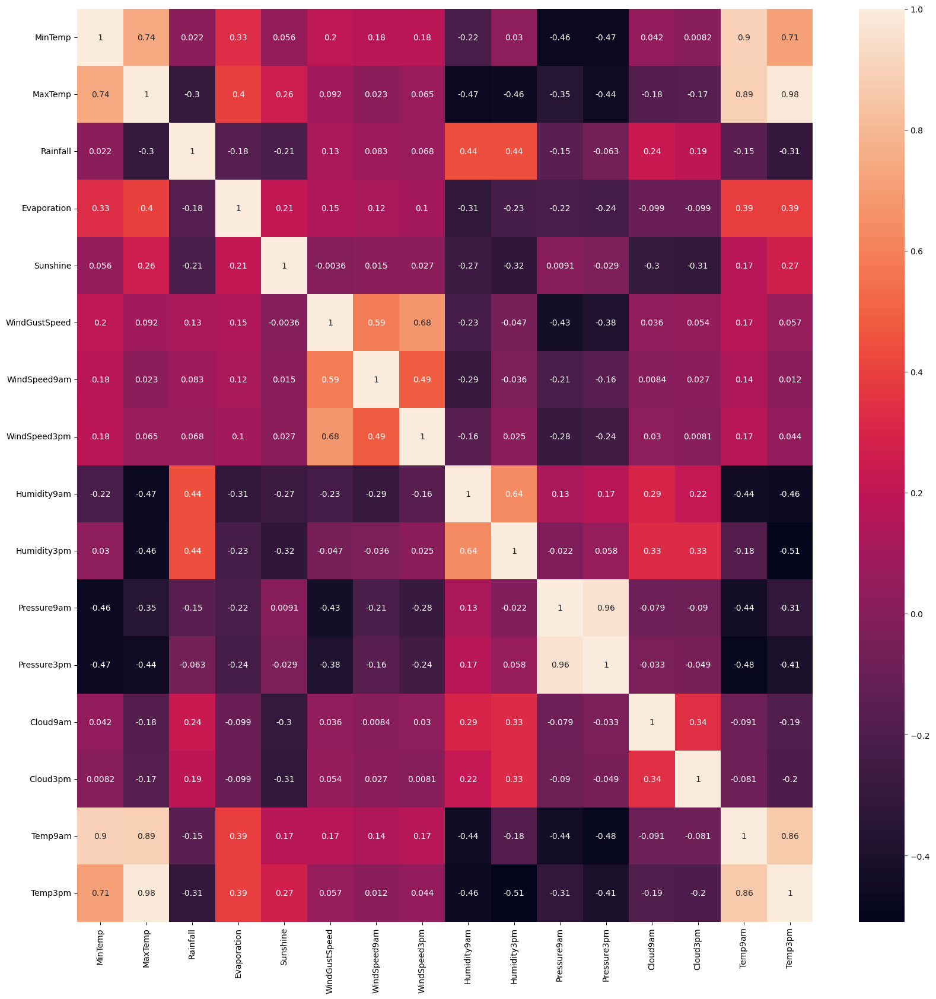

In [10]:
# Correlation
corr_f = df[num_features].corr(method='spearman')
plt.figure(figsize=(20,20))
sns.heatmap(corr_f, annot=True)

### Categorical Analysis (Univariate)

In [11]:
cat_features

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

C:\Users\user\AppData\Local\Temp\ipykernel_11828\782512774.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


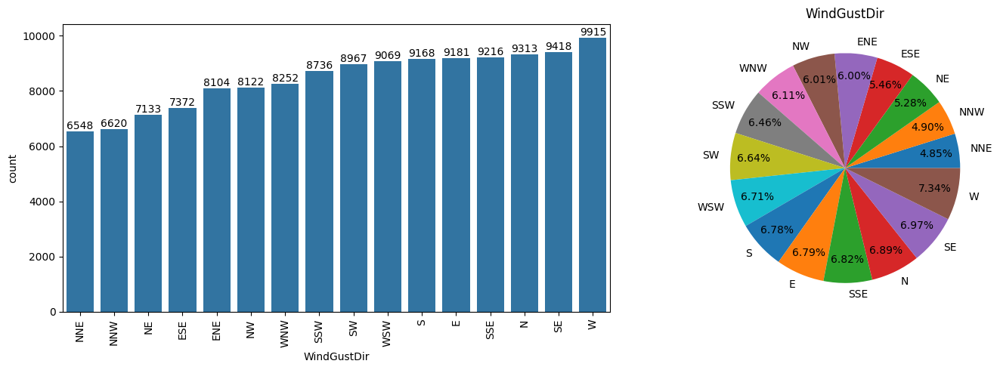

In [12]:
c=df['WindGustDir'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindGustDir'], ax=ax[0], order=c.index)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0], labels=c.values)
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindGustDir')
plt.tight_layout()
plt.show()


WindGusDir - The direction of the strongest gust during a particular day. (16 compass points)
- *North North East* has low chance and *West* has high chance.

C:\Users\user\AppData\Local\Temp\ipykernel_11828\2823385211.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


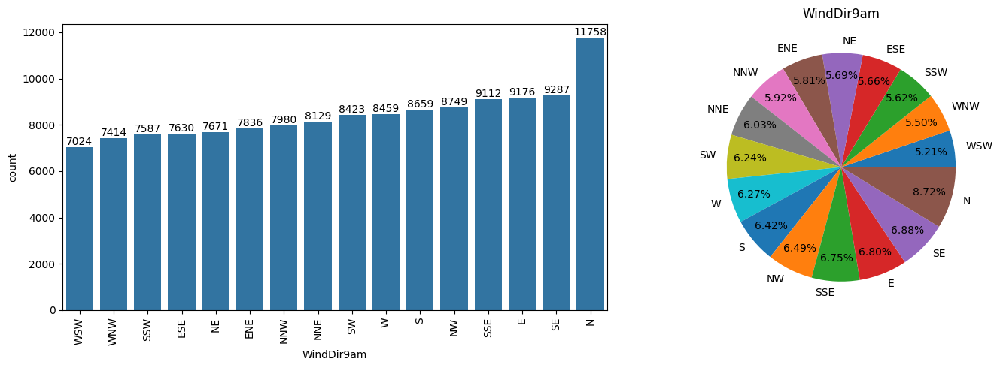

In [13]:
c = df['WindDir9am'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindDir9am'], ax=ax[0], order=c.index)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0], labels=c.values)
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindDir9am')
plt.tight_layout()
plt.show()

WindDir9am - The direction of the wind for 10 min prior to 9 am. (compass points)
- *North* has High chance and *West South West* has Low chance.

C:\Users\user\AppData\Local\Temp\ipykernel_11828\713168687.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


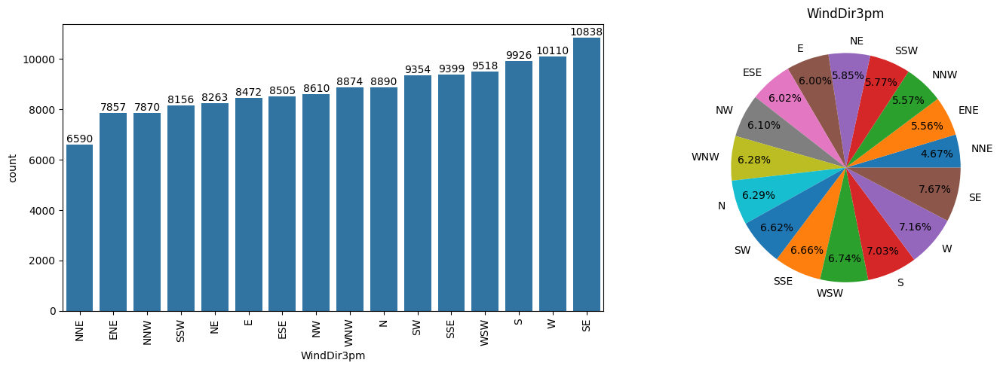

In [14]:
c = df['WindDir3pm'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindDir3pm'], ax=ax[0], order=c.index)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0], labels=c.values)
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindDir3pm')
plt.tight_layout()
plt.show()

WindDir3pm - The direction of the wind for 10 min prior to 3 pm. (compass points).
- *North North East* has Low chance and *South East* has High chance.

C:\Users\user\AppData\Local\Temp\ipykernel_11828\768618519.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=30)


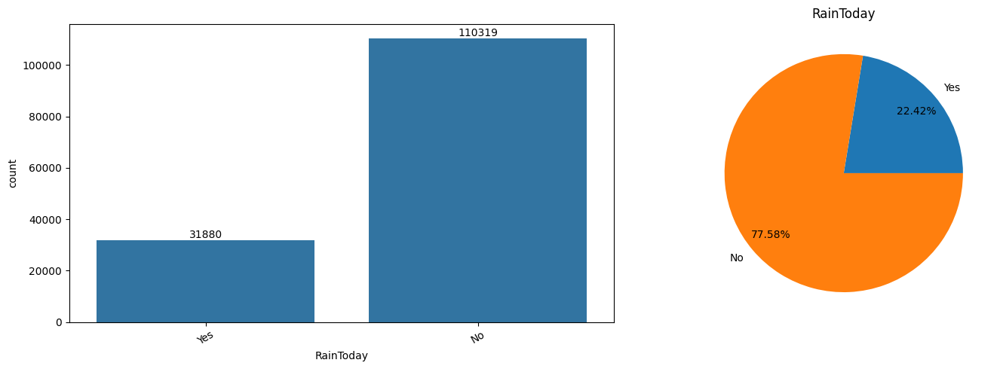

In [15]:
c=df['RainToday'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['RainToday'], ax=ax[0], order=c.index)
g.set_xticklabels(g.get_xticklabels(),rotation=30)
g.bar_label(container=g.containers[0], labels=c.values)
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('RainToday')
plt.tight_layout()
plt.show()


RainToday - If today is rainy then ‘Yes’. If today is not rainy then ‘No’.
- Very High difference between Yes and No categories, due happening inbalancing.

C:\Users\user\AppData\Local\Temp\ipykernel_11828\3282677339.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=30)


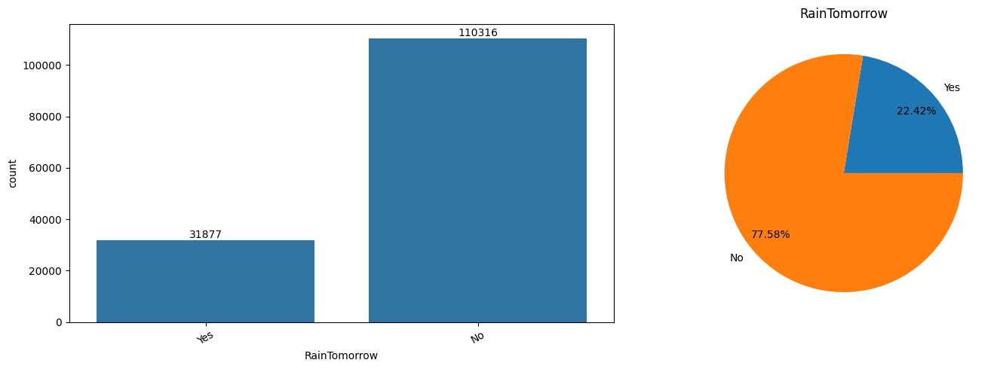

In [16]:
c=df['RainTomorrow'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['RainTomorrow'], ax=ax[0], order=c.index)
g.set_xticklabels(g.get_xticklabels(),rotation=30)
g.bar_label(container=g.containers[0], labels=c.values)
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('RainTomorrow')
plt.tight_layout()
plt.show()

RainTomorrow - If tomorrow is rainy then 1 (Yes). If tomorrow is not rainy then 0 (No).
- Very High difference between Yes and No categories, due happening inbalancing.


### Categorical Features with Bivariate analysis

C:\Users\user\AppData\Local\Temp\ipykernel_11828\1394260697.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


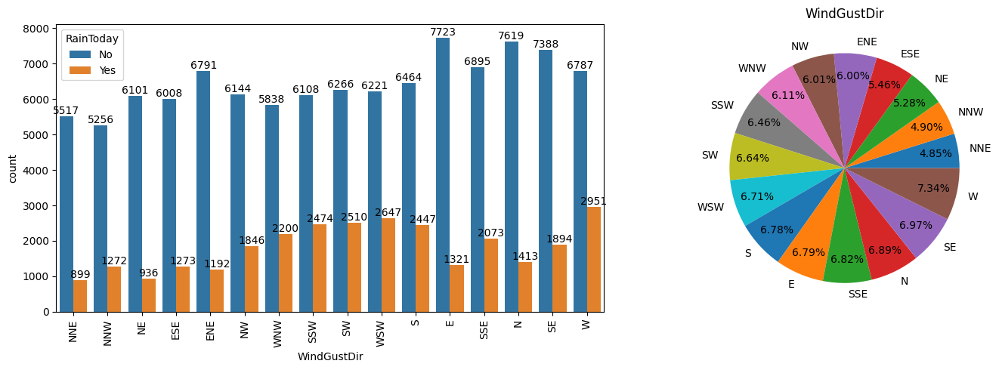

In [17]:
c=df['WindGustDir'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindGustDir'], ax=ax[0], order=c.index, hue=df['RainToday'])
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0])
g.bar_label(container=g.containers[1])
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindGustDir')
plt.tight_layout()
plt.show()

 When wind direction is *East* then less chance of rain, and *West* then high chance of rain.

C:\Users\user\AppData\Local\Temp\ipykernel_11828\2927927551.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


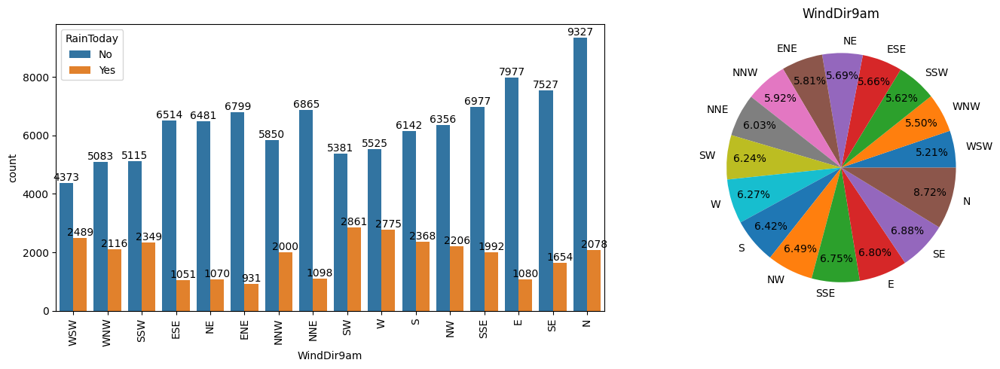

In [18]:
c=df['WindDir9am'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindDir9am'], ax=ax[0], order=c.index, hue=df['RainToday'])
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0])
g.bar_label(container=g.containers[1])
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindDir9am')
plt.tight_layout()
plt.show()

Wind direction at 9 am higher chance for north and lower chance for WSW, but higher chances of rain when WSW wind direction

C:\Users\user\AppData\Local\Temp\ipykernel_11828\60493136.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(g.get_xticklabels(),rotation=90)


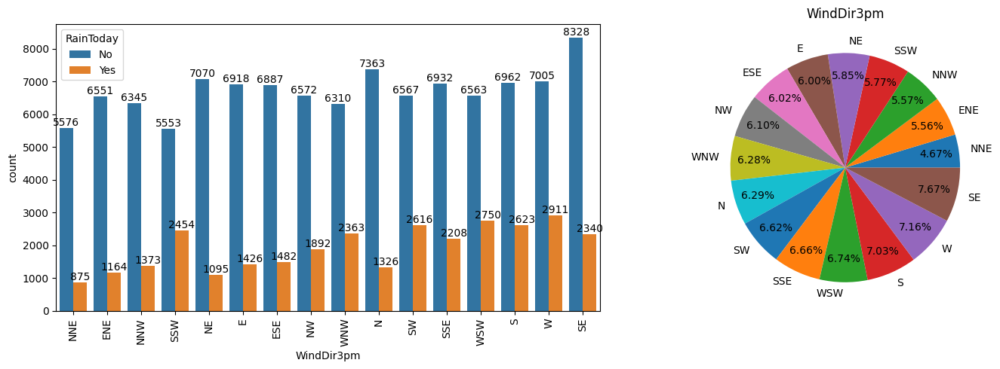

In [19]:
c=df['WindDir3pm'].value_counts(ascending=True)

fig, ax = plt.subplots(1,2, figsize=(15,5))
g = sns.countplot(x=df['WindDir3pm'], ax=ax[0], order=c.index, hue=df['RainToday'])
g.set_xticklabels(g.get_xticklabels(),rotation=90)
g.bar_label(container=g.containers[0])
g.bar_label(container=g.containers[1])
ax[1]=plt.pie(c,labels=c.keys(), autopct='%.2f%%', pctdistance=0.8)
plt.title('WindDir3pm')
plt.tight_layout()
plt.show()

Wind direction at 3 pm higher chance for SE and lower chance for NNE, but higher chances of rain when SSW wind direction

In [20]:
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,145460,143975.000000,144199.000000,142199.000000,145460.000000,145460.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,145460.000000,145460.000000,143693.000000,141851.00000
mean,2013-04-04 21:08:51.907053568,12.194034,23.221348,2.360918,5.464988,7.609641,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.446556,4.508112,16.990631,21.68339
min,2007-11-01 00:00:00,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,2011-01-11 00:00:00,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,2013-06-02 00:00:00,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,2015-06-14 00:00:00,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,2017-06-25 00:00:00,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000
std,NaN,6.398495,7.119049,8.478060,4.210586,3.785983,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887669,2.719517,6.488753,6.93665


### Check the distribution of each feature (Univariate)

MinTemp


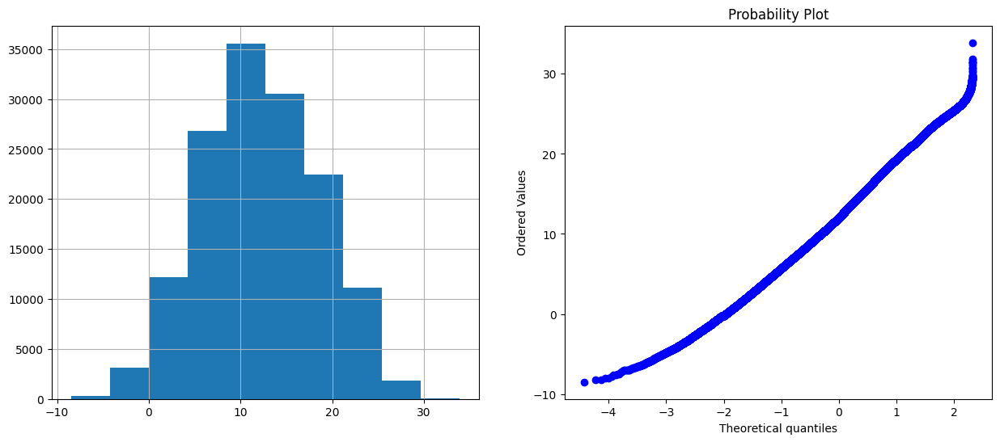

MaxTemp


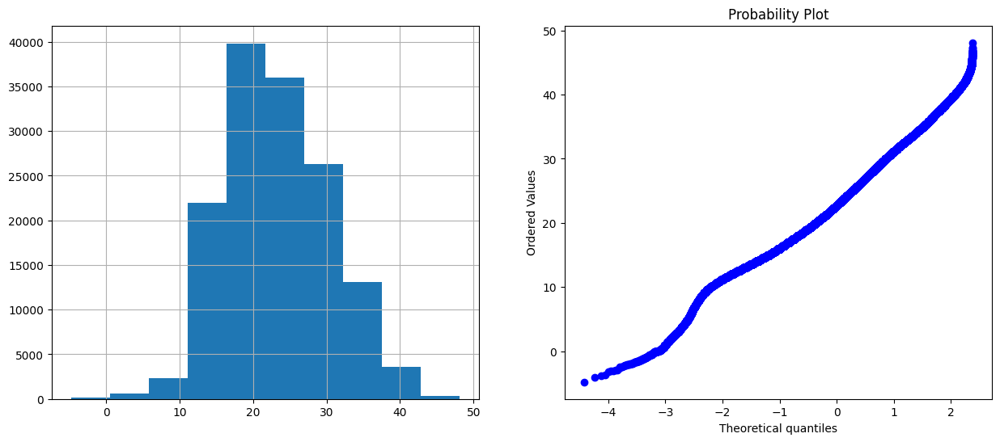

Rainfall


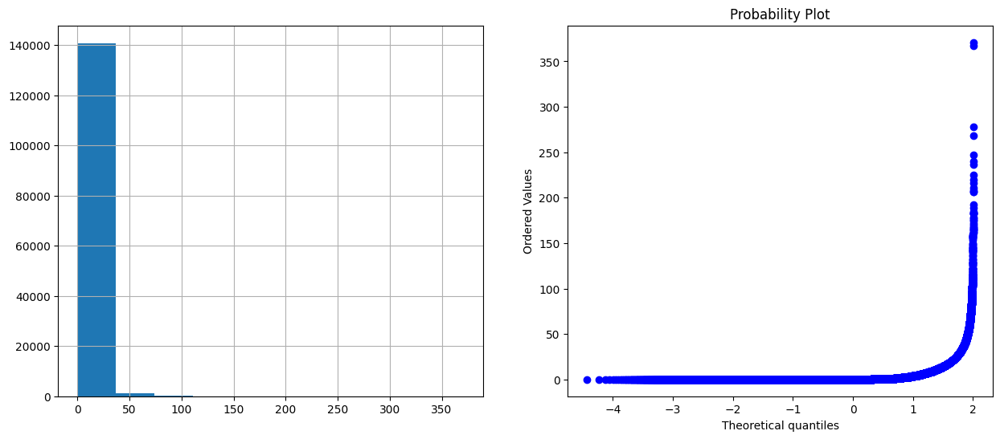

Evaporation


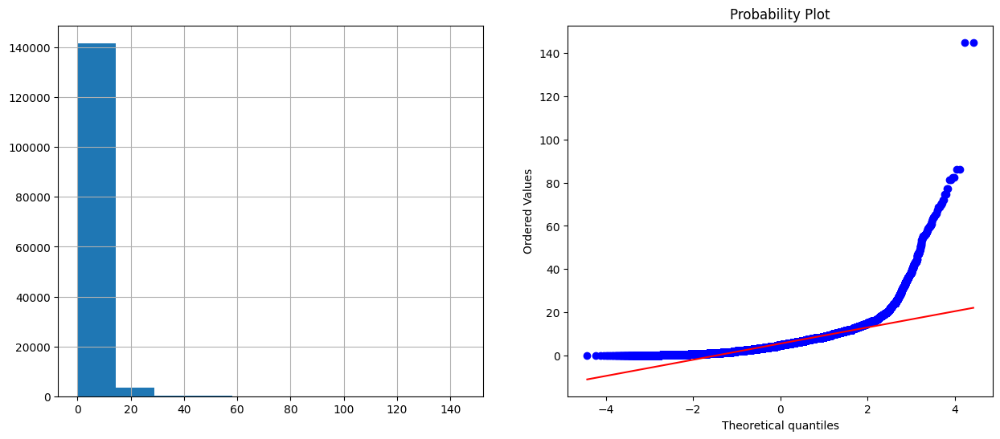

Sunshine


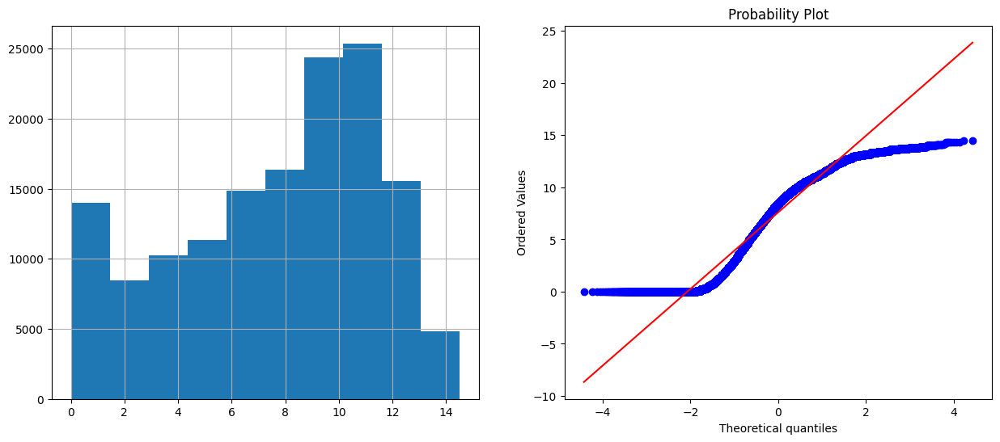

WindGustSpeed


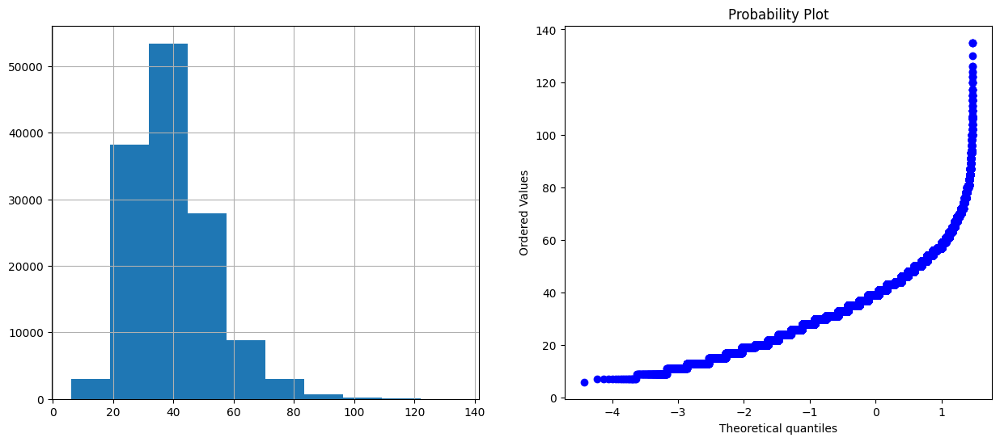

WindSpeed9am


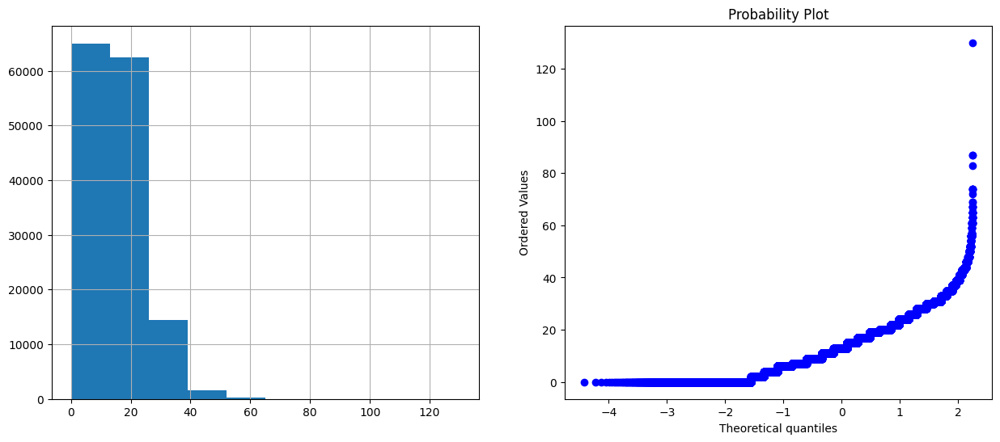

WindSpeed3pm


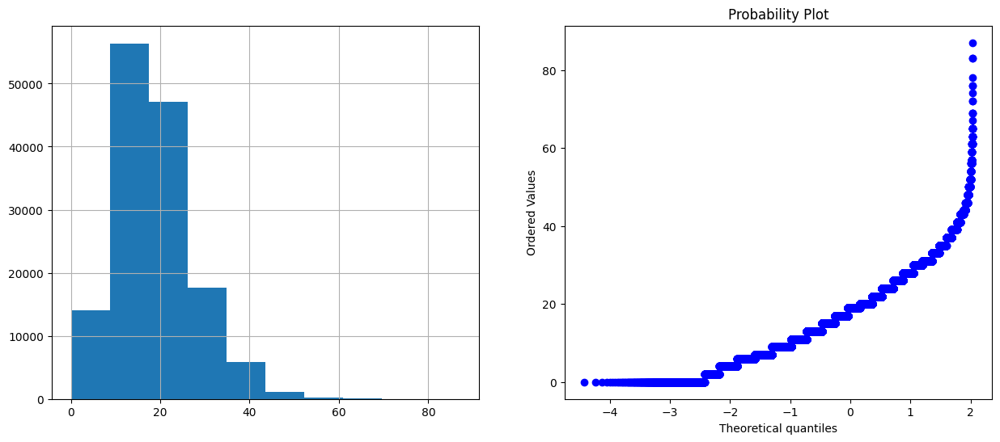

Humidity9am


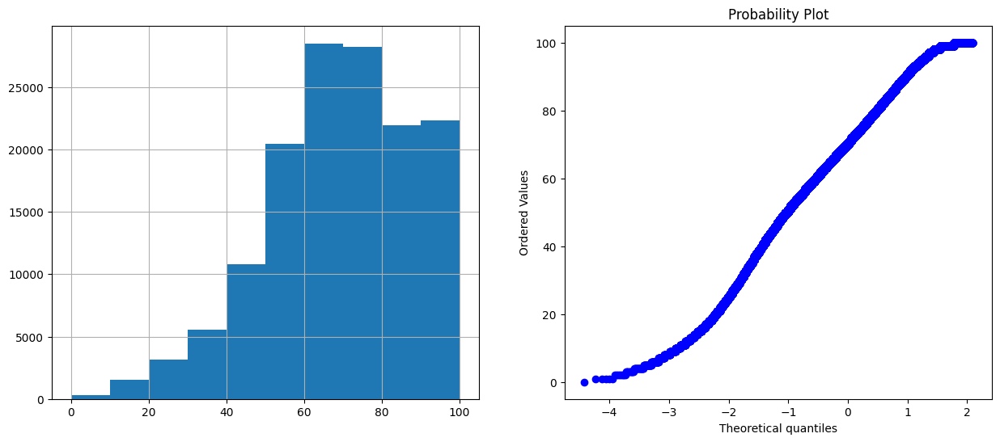

Humidity3pm


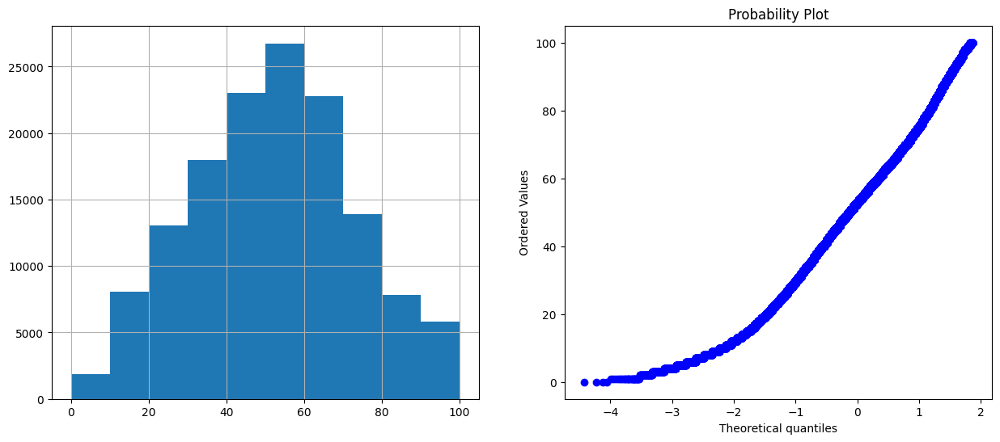

Pressure9am


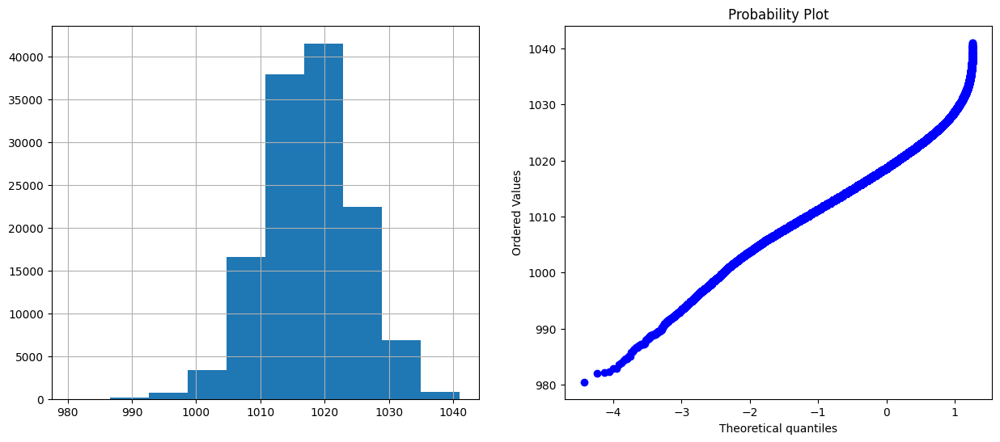

Pressure3pm


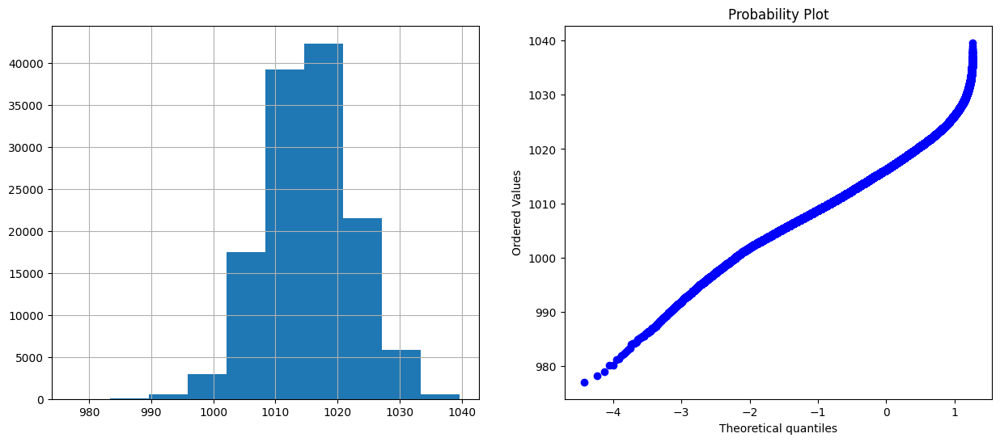

Cloud9am


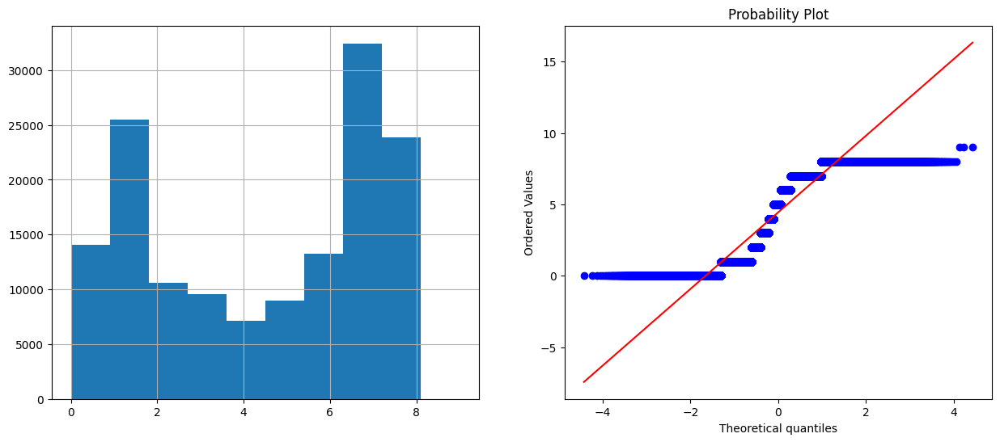

Cloud3pm


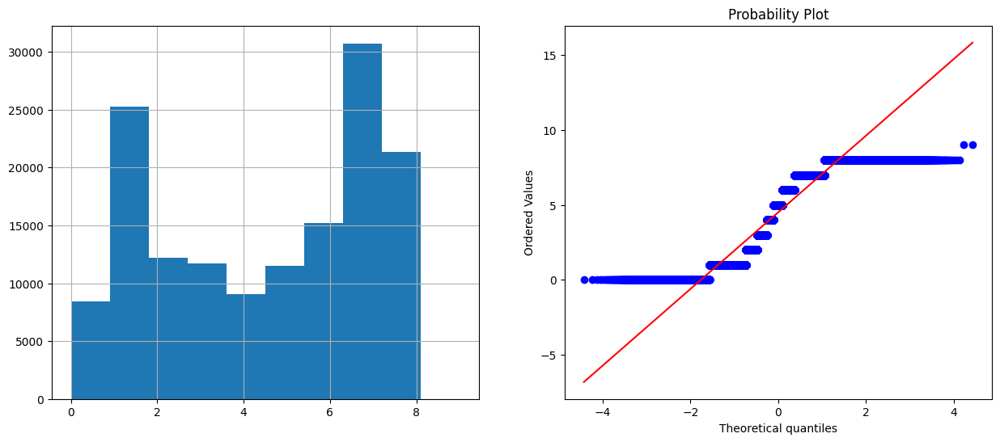

Temp9am


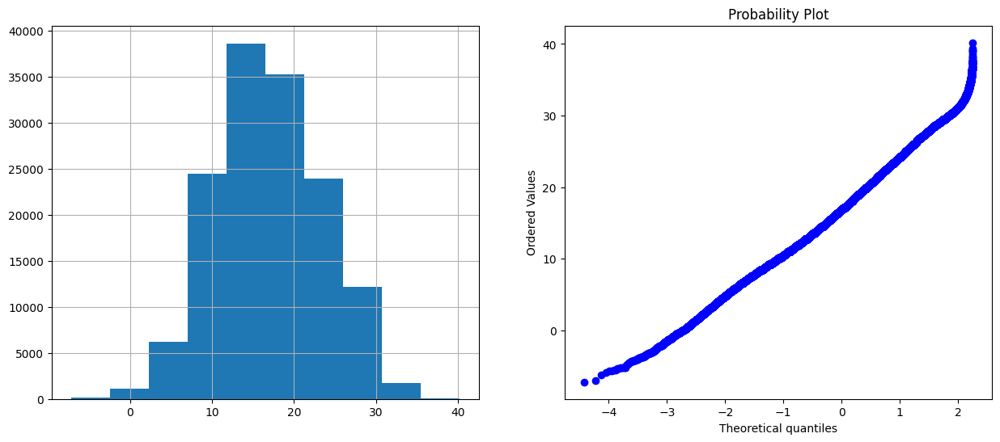

Temp3pm


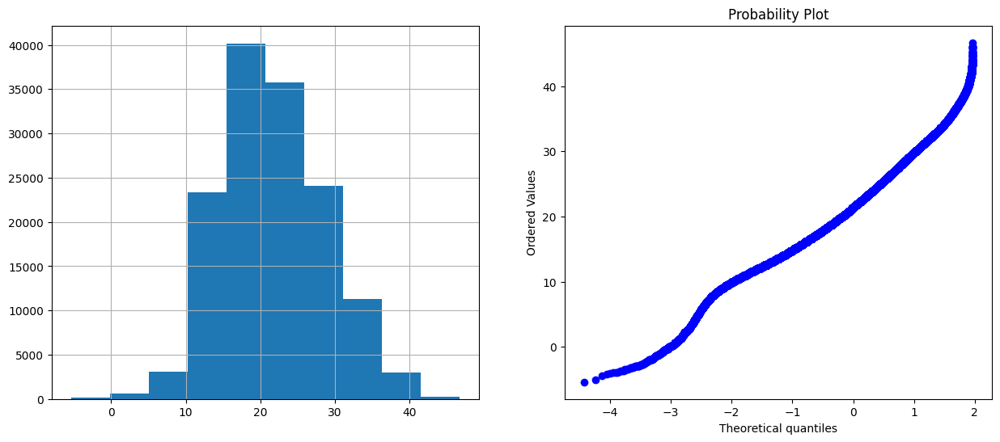

In [21]:
for feature in num_features:
    print(feature)
    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    df[feature].hist()
    plt.subplot(1,2,2)
    stats.probplot(df[feature], dist='norm',plot=plt)
    plt.show()

In [22]:
import matplotlib.pylab as plb
def normality_of_feature(df, feature):
    plt.figure(figsize=(8,3))
    plt.subplot(1,3,1)
    sns.histplot(df[feature])
    plt.subplot(1,3,2)
    stats.probplot(df[feature], plot=plb)
    plt.subplot(1,3,3)
    sns.boxplot(df[feature])
    plt.title(f'boxplot {feature}')
    plt.show()

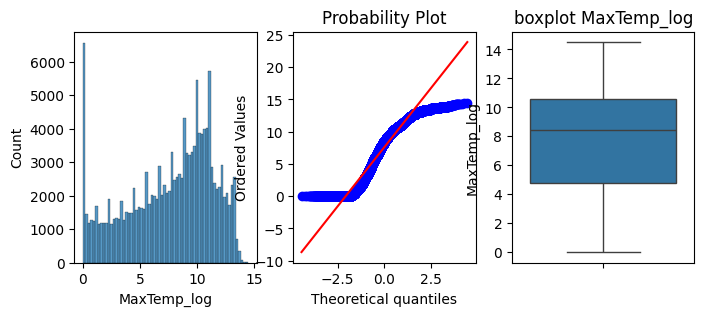

In [23]:
df['MaxTemp_log']=df.Sunshine
normality_of_feature(df, 'MaxTemp_log')

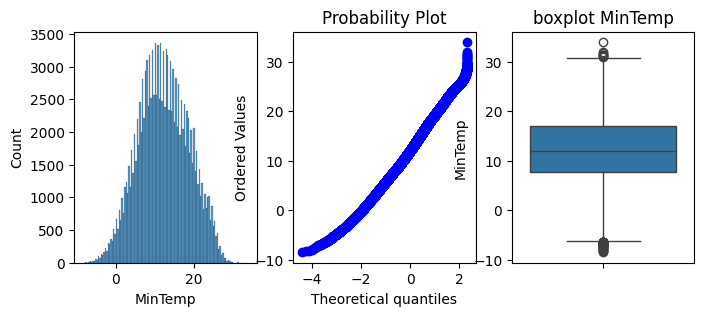

None


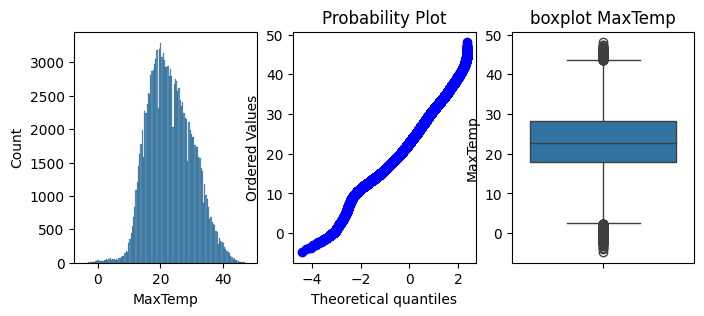

None


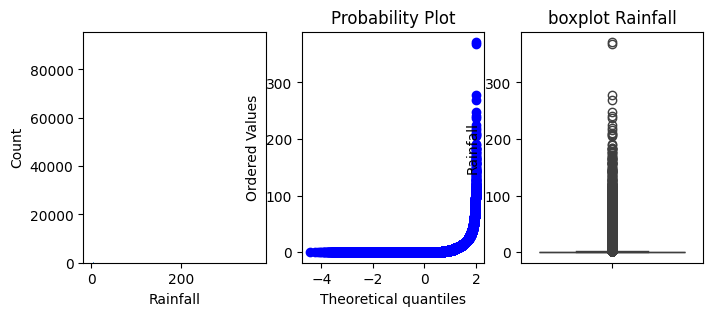

None


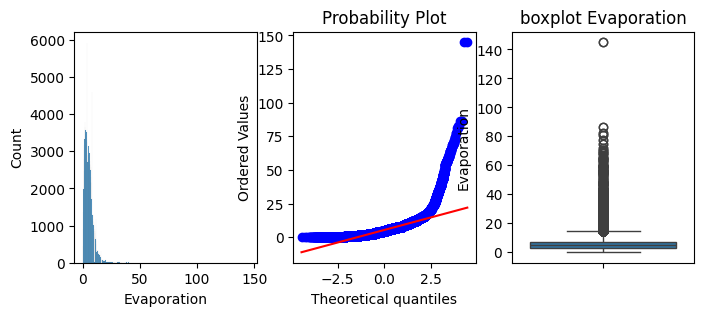

None


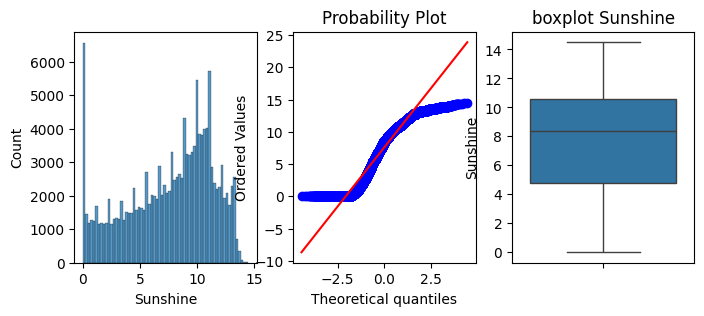

None


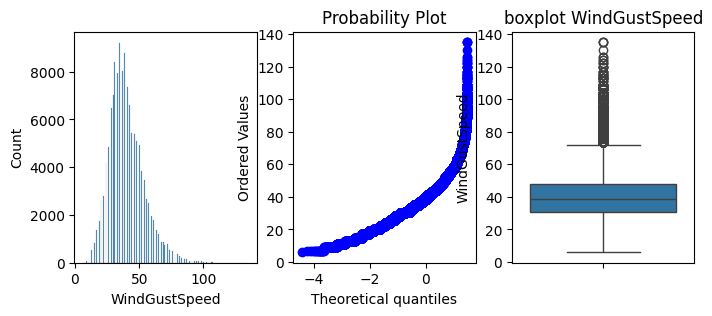

None


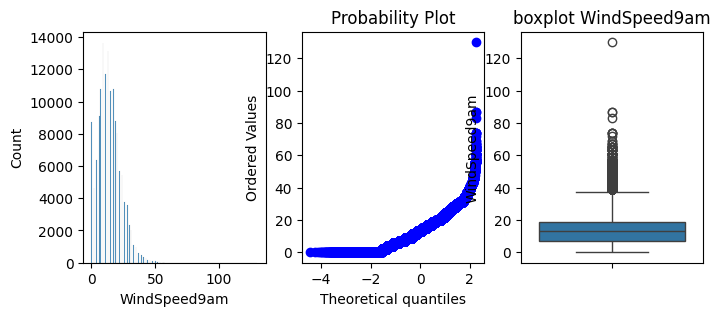

None


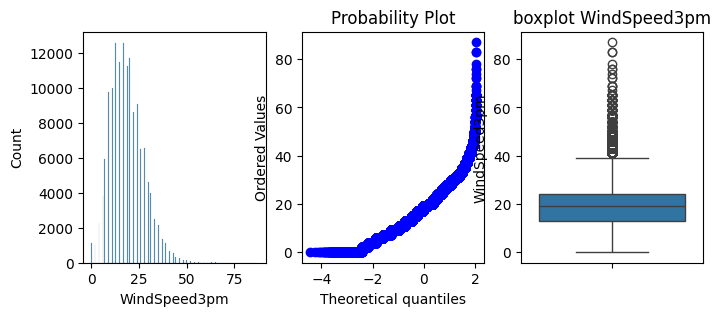

None


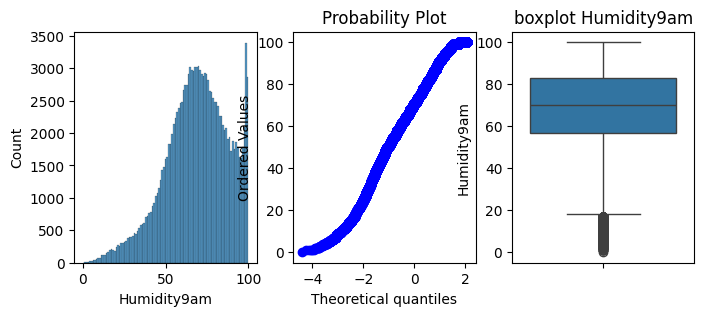

None


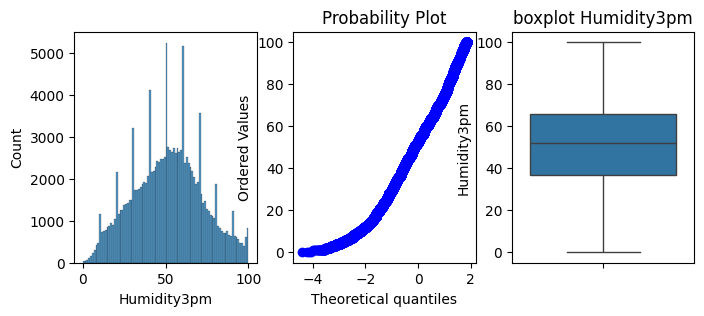

None


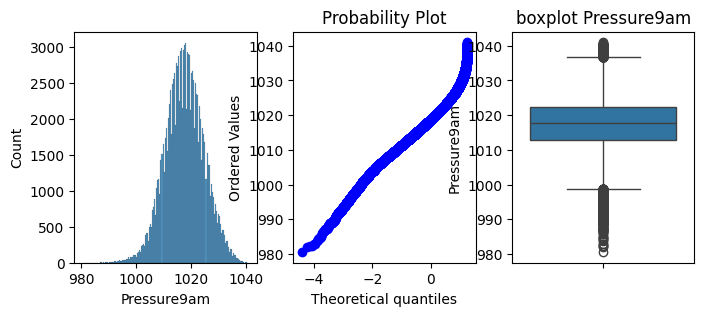

None


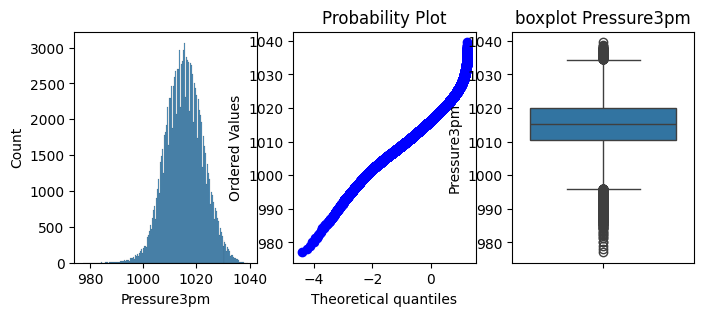

None


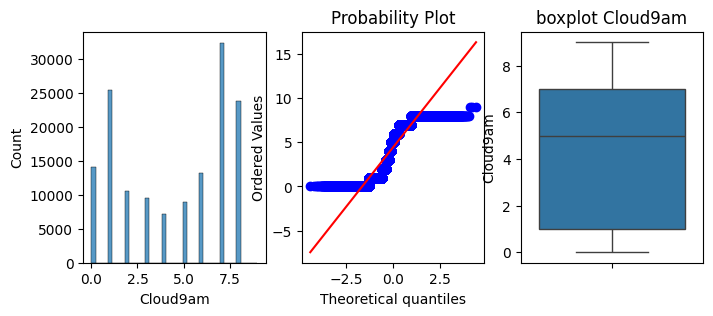

None


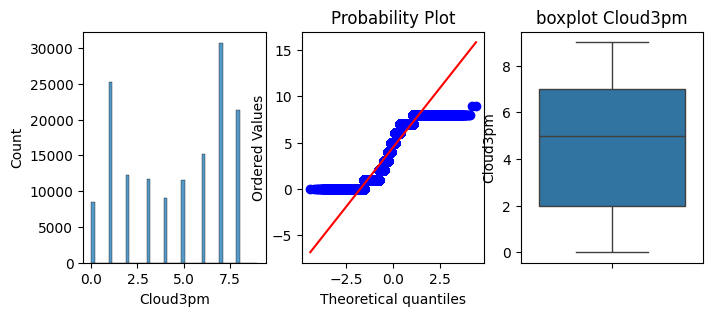

None


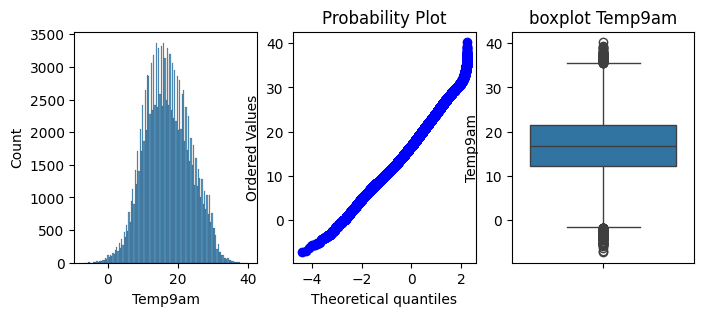

None


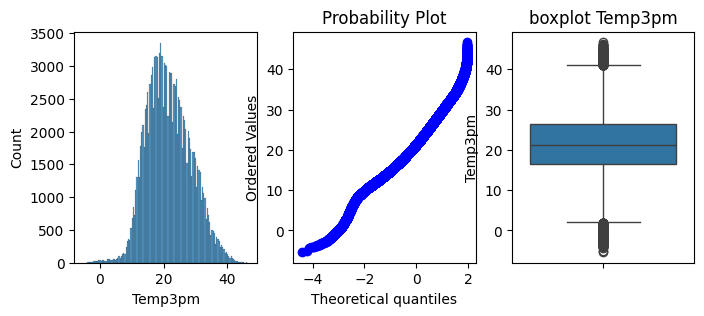

None


In [24]:
for i in num_features:
    print(normality_of_feature(df, i))

<Figure size 2000x2000 with 0 Axes>

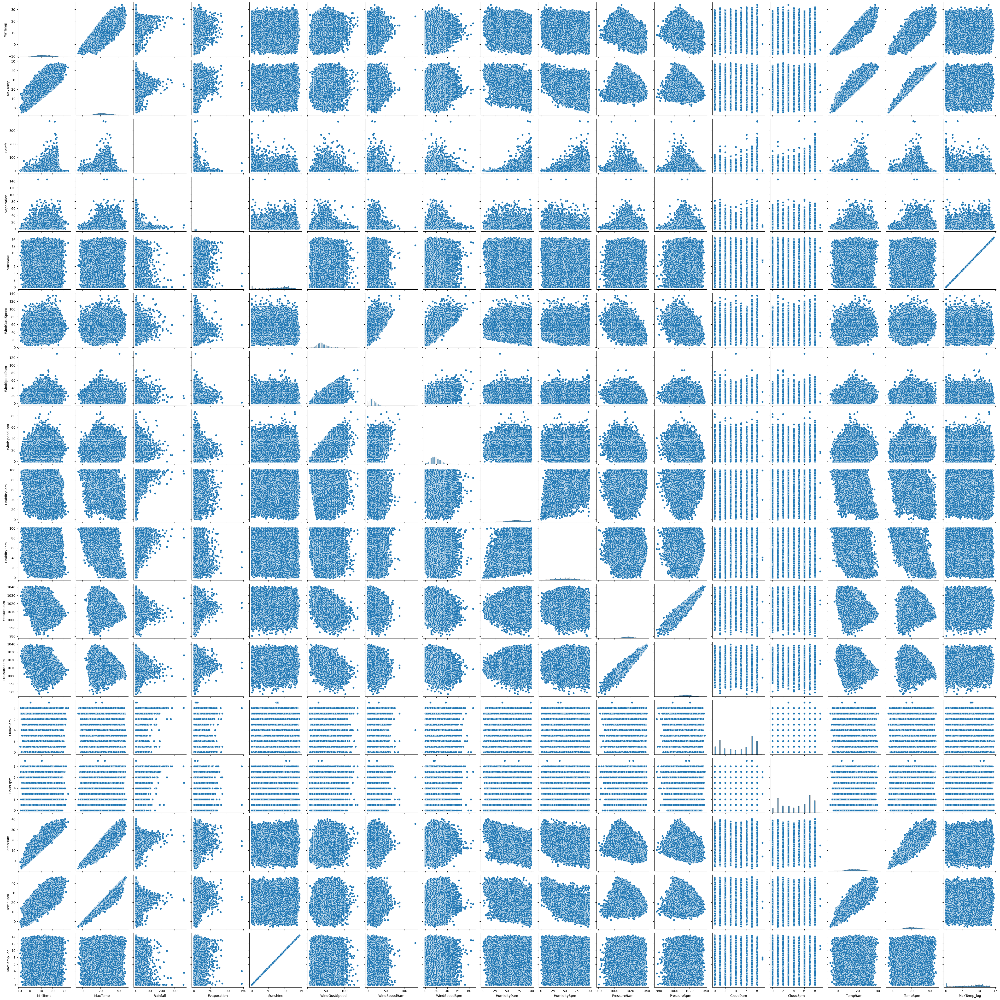

In [25]:
plt.figure(figsize=(20,20))
sns.pairplot(df)